In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
mar20_df = pd.read_csv('202003-citibike-tripdata.csv')
mar20_df.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender
0,1589,2020-03-01 00:00:03.6400,2020-03-01 00:26:32.9860,224,Spruce St & Nassau St,40.711464,-74.005524,3574,Prospect Pl & Underhill Ave,40.676969,-73.965790,16214,Subscriber,1980,1
1,389,2020-03-01 00:00:16.7560,2020-03-01 00:06:46.0620,293,Lafayette St & E 8 St,40.730207,-73.991026,223,W 13 St & 7 Ave,40.737815,-73.999947,29994,Subscriber,1991,2
2,614,2020-03-01 00:00:20.0580,2020-03-01 00:10:34.2200,379,W 31 St & 7 Ave,40.749156,-73.991600,515,W 43 St & 10 Ave,40.760094,-73.994618,39853,Subscriber,1991,1
3,597,2020-03-01 00:00:24.3510,2020-03-01 00:10:22.3390,3739,Perry St & Greenwich Ave,40.735918,-74.000939,325,E 19 St & 3 Ave,40.736245,-73.984738,42608,Subscriber,1989,1
4,1920,2020-03-01 00:00:26.1120,2020-03-01 00:32:26.2680,236,St Marks Pl & 2 Ave,40.728419,-73.987140,3124,46 Ave & 5 St,40.747310,-73.954510,36288,Subscriber,1993,1


In [3]:
mar20_df.shape

(1068457, 15)

In [4]:
mar20_df.tail()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender
1068452,137,2020-03-31 23:56:06.0490,2020-03-31 23:58:23.3880,422,W 59 St & 10 Ave,40.770513,-73.988038,3356,Amsterdam Ave & W 66 St,40.774667,-73.984706,18851,Subscriber,1989,2
1068453,1548,2020-03-31 23:57:27.6850,2020-04-01 00:23:16.4110,523,W 38 St & 8 Ave,40.754666,-73.991382,442,W 27 St & 7 Ave,40.746647,-73.993915,36539,Subscriber,1993,1
1068454,308,2020-03-31 23:58:00.2690,2020-04-01 00:03:08.9500,528,2 Ave & E 31 St,40.742909,-73.977061,487,E 20 St & FDR Drive,40.733143,-73.975739,43023,Subscriber,1982,1
1068455,872,2020-03-31 23:58:42.9010,2020-04-01 00:13:15.5860,3043,Lewis Ave & Decatur St,40.681460,-73.934903,3755,DeKalb Ave & Franklin Ave,40.690648,-73.957462,43073,Customer,1990,1
1068456,306,2020-03-31 23:59:17.2580,2020-04-01 00:04:23.8880,3721,31 St & Newtown Ave,40.767549,-73.920933,3592,Crescent St & Broadway,40.763359,-73.928647,39373,Subscriber,1974,1


In [5]:
mar20_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1068457 entries, 0 to 1068456
Data columns (total 15 columns):
tripduration               1068457 non-null int64
starttime                  1068457 non-null object
stoptime                   1068457 non-null object
start station id           1068457 non-null int64
start station name         1068457 non-null object
start station latitude     1068457 non-null float64
start station longitude    1068457 non-null float64
end station id             1068457 non-null int64
end station name           1068457 non-null object
end station latitude       1068457 non-null float64
end station longitude      1068457 non-null float64
bikeid                     1068457 non-null int64
usertype                   1068457 non-null object
birth year                 1068457 non-null int64
gender                     1068457 non-null int64
dtypes: float64(4), int64(6), object(5)
memory usage: 122.3+ MB


In [6]:
from datetime import datetime

In [7]:
mar20_df['year'] = pd.DatetimeIndex(mar20_df['starttime']).year
mar20_df['month'] = pd.DatetimeIndex(mar20_df['starttime']).month
mar20_df['day'] = pd.DatetimeIndex(mar20_df['starttime']).day
mar20_df['hour'] = pd.DatetimeIndex(mar20_df['starttime']).hour
mar20_df['minute'] = pd.DatetimeIndex(mar20_df['starttime']).minute

In [8]:
mar20_df.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender,year,month,day,hour,minute
0,1589,2020-03-01 00:00:03.6400,2020-03-01 00:26:32.9860,224,Spruce St & Nassau St,40.711464,-74.005524,3574,Prospect Pl & Underhill Ave,40.676969,-73.965790,16214,Subscriber,1980,1,2020,3,1,0,0
1,389,2020-03-01 00:00:16.7560,2020-03-01 00:06:46.0620,293,Lafayette St & E 8 St,40.730207,-73.991026,223,W 13 St & 7 Ave,40.737815,-73.999947,29994,Subscriber,1991,2,2020,3,1,0,0
2,614,2020-03-01 00:00:20.0580,2020-03-01 00:10:34.2200,379,W 31 St & 7 Ave,40.749156,-73.991600,515,W 43 St & 10 Ave,40.760094,-73.994618,39853,Subscriber,1991,1,2020,3,1,0,0
3,597,2020-03-01 00:00:24.3510,2020-03-01 00:10:22.3390,3739,Perry St & Greenwich Ave,40.735918,-74.000939,325,E 19 St & 3 Ave,40.736245,-73.984738,42608,Subscriber,1989,1,2020,3,1,0,0
4,1920,2020-03-01 00:00:26.1120,2020-03-01 00:32:26.2680,236,St Marks Pl & 2 Ave,40.728419,-73.987140,3124,46 Ave & 5 St,40.747310,-73.954510,36288,Subscriber,1993,1,2020,3,1,0,0


In [9]:
date = mar20_df['day'].values
month = mar20_df['month'].values
year = mar20_df['year'].values
hour = mar20_df['hour'].values
minute = mar20_df['minute'].values
station_start = mar20_df['start station id'].values
station_end = mar20_df['end station id'].values

In [10]:
weekday = np.zeros(len(date))
weekday[:] = np.nan
cnt = 0

for _year, _month, _date, _hour, _minute in zip(year, month, date, hour, minute):
    _dt = datetime(_year, _month, _date, _hour, _minute)
    _weekday = _dt.weekday()
    weekday[cnt] = _weekday
    cnt += 1
    
IsWeekday = weekday < 5
mar20_df['IsWeekday'] = IsWeekday

mar20_df['TimeSlice'] = (hour*3 + np.floor(minute/20)).astype(int)

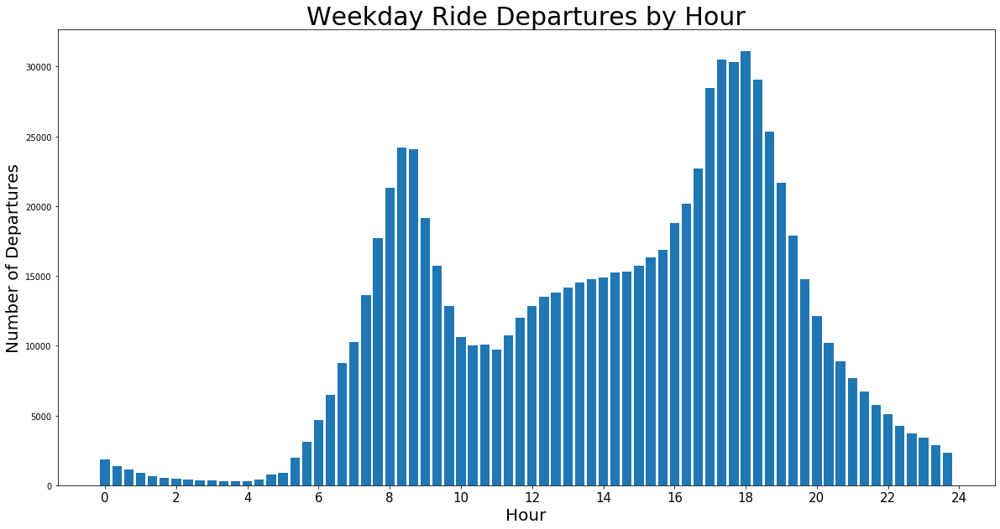

In [11]:
wkday_by_timeslice = mar20_df[mar20_df['IsWeekday']==True].groupby('TimeSlice').count().values[:,0]
plt.figure(figsize=(20,10))
plt.bar(range(0,72), wkday_by_timeslice)
plt.xlabel('Hour',fontsize=20)
plt.xticks(ticks=range(0,78,6),labels=list(range(0,26,2)),fontsize=15)
plt.ylabel('Number of Departures',fontsize=20)
plt.title('Weekday Ride Departures by Hour',fontsize=30)
plt.show()

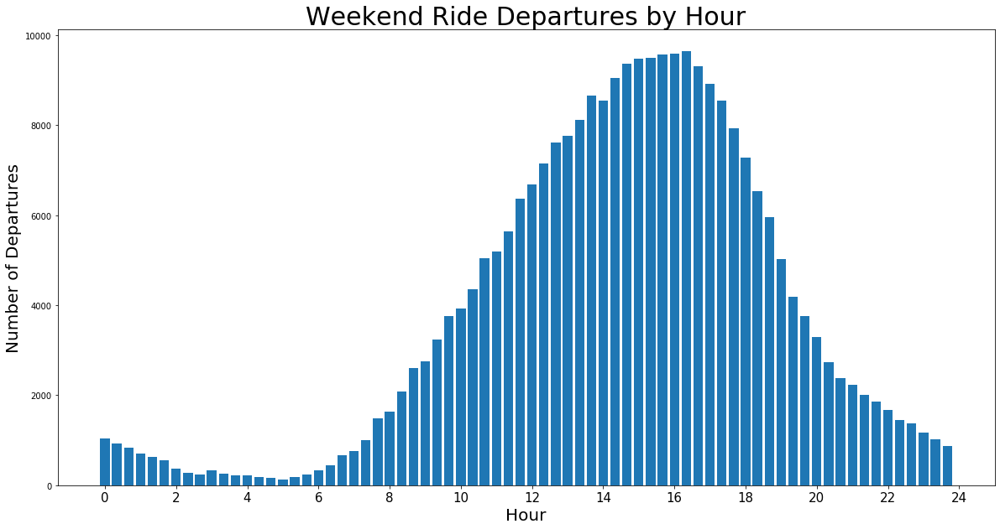

In [12]:
wknd_by_timeslice = mar20_df[mar20_df['IsWeekday']==False].groupby('TimeSlice').count().values[:,0]
plt.figure(figsize=(20,10))
plt.bar(range(0,72), wknd_by_timeslice)
plt.xlabel('Hour',fontsize=20)
plt.xticks(ticks=range(0,78,6),labels=list(range(0,26,2)),fontsize=15)
plt.ylabel('Number of Departures',fontsize=20)
plt.title('Weekend Ride Departures by Hour',fontsize=30)
plt.show()

In [13]:
locations = mar20_df.groupby("start station id").first()
locations = locations.loc[:, ["start station latitude","start station longitude","start station name"]]

In [14]:
def get_trip_counts_by_hour(selected_hour):
    # make a DataFrame with locations for each bike station
    locations = mar20_df.groupby("start station id").first()
    locations = locations.loc[:, ["start station latitude",
                                 "start station longitude",
                                 "start station name"]]
    
    #select one time of day
    subset = mar20_df[mar20_df["hour"]==selected_hour]
    
    # count trips for each destination
    departure_counts =  subset.groupby("start station id").count()
    departure_counts = departure_counts.iloc[:,[0]]
    departure_counts.columns= ["departure count"]
    
    # count trips for each origin
    arrival_counts =  subset.groupby("end station id").count().iloc[:,[0]]
    arrival_counts.columns= ["arrival count"]

    #join departure counts, arrival counts, and locations
    trip_counts = departure_counts.join(locations).join(arrival_counts)
    return trip_counts

# print a sample to check our code works
get_trip_counts_by_hour(8).head()

,departure count,start station latitude,start station longitude,start station name,arrival count
start station id,,,,,
72,248,40.767272,-73.993929,W 52 St & 11 Ave,187.0
79,66,40.719116,-74.006667,Franklin St & W Broadway,100.0
82,45,40.711174,-74.000165,St James Pl & Pearl St,46.0
83,32,40.683826,-73.976323,Atlantic Ave & Fort Greene Pl,72.0
116,256,40.741776,-74.001497,W 17 St & 8 Ave,213.0


In [15]:
import folium
def plot_station_counts(trip_counts):

    NYC = [40.738, -73.98]
    folium_map = folium.Map(location = NYC, zoom_start = 12, tiles = "CartoDB positron")
    
    for index, row in trip_counts.iterrows():
        # calculate net departures
        net_departures = (row["departure count"]-row["arrival count"])
        
        # generate the popup message that is shown on click.
        popup_text = "{}<br> total departures: {}<br> total arrivals: {}<br> net departures: {}"
        popup_text = popup_text.format(row["start station name"],
                          row["departure count"],
                          row["arrival count"],
                          net_departures)
        
        radius = net_departures/25
        if net_departures>0:
            color="#E37222"
        else:          
            color="#0A8A9F"
            
        folium.CircleMarker(location=(row["start station latitude"],row["start station longitude"]),
                            radius=abs(radius),
                            color=color,
                            popup=popup_text,
                            fill=True).add_to(folium_map)
    return folium_map

In [16]:
trip_counts = get_trip_counts_by_hour(8)
map_8am = plot_station_counts(trip_counts)
# map_8am.save("map_8am.html")

In [17]:
map_8am

In [18]:
trip_counts = get_trip_counts_by_hour(18)
map_6pm = plot_station_counts(trip_counts)
# map_6pm.save("map_6pm.html")

In [19]:
map_6pm

In [20]:
from folium.plugins import MarkerCluster

def plot_cluster_map(trip_counts):

    NYC = [40.738, -73.98]
    folium_map = folium.Map(location = NYC, zoom_start = 12, tiles = "CartoDB positron")
    marker_cluster = MarkerCluster().add_to(folium_map)
    
    for index, row in trip_counts.iterrows():
        # calculate net departures
        net_departures = (row["departure count"]-row["arrival count"])
        
        # generate the popup message that is shown on click.
        popup_text = "{}<br> total departures: {}<br> total arrivals: {}<br> net departures: {}"
        popup_text = popup_text.format(row["start station name"],
                          row["departure count"],
                          row["arrival count"],
                          net_departures)
        
        radius = net_departures/25
        if net_departures>0:
            color="#E37222"
        else:          
            color="#0A8A9F"
            
        folium.CircleMarker(location=(row["start station latitude"],row["start station longitude"]),
                            radius=abs(radius),
                            color=color,
                            popup=popup_text,
                            fill=True).add_to(marker_cluster)
    return folium_map

In [21]:
trip_counts = get_trip_counts_by_hour(8)
map_8am_cluster = plot_cluster_map(trip_counts)
# map_8am_cluster.save("clustermap_8am.html")
map_8am_cluster

In [22]:
trip_counts = get_trip_counts_by_hour(18)
map_6pm_cluster = plot_cluster_map(trip_counts)
# map_6pm_cluster.save("clustermap_6pm.html")
map_6pm_cluster

In [23]:
!pip install selenium

     |████████████████████████████████| 911kB 2.3MB/s eta 0:00:01


In [24]:
from PIL import Image, ImageDraw, ImageFont
from folium import plugins
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap, rgb_to_hsv, hsv_to_rgb
import scipy.ndimage.filters
import time
import os.path
import io

import os
os.environ["PATH"] += os.pathsep + "."

In [25]:
def get_kernel(kernel_size, blur=1/20, halo=.001):
    
    # generate x and y grids
    x, y = np.mgrid[0:kernel_size*2+1, 0:kernel_size*2+1]
    
    center = kernel_size + 1  # center pixel
    r = np.sqrt((x - center)**2 + (y - center)**2)  # distance from center
    
    # now compute the kernel. This function is a bit arbitrary. 
    # adjust this to get the effect you want.
    kernel = np.exp(-r/kernel_size/blur) + (1 - r/r[center,0]).clip(0)*halo
    return kernel

def add_lines(image_array, xys, width=1, weights=None):
    
    for i, xy in enumerate(xys):  # loop over lines
        # create a new gray scale image
        image = Image.new("L",(image_array.shape[1], image_array.shape[0]))
        
        # draw the line
        ImageDraw.Draw(image).line(xy, 200, width=width)
        
        #convert to array
        new_image_array = np.asarray(image, dtype=np.uint8).astype(float)
        
        # apply weights if provided
        if weights is not None:
            new_image_array *= weights[i]
            
        # add to existing array
        image_array += new_image_array

    # convolve image
    new_image_array = scipy.ndimage.filters.convolve(image_array, get_kernel(width*4)) 
    return new_image_array

In [26]:
def to_image(array, hue=.62):
    """converts an array of floats to an array of RGB values using a colormap"""
    
    # apply saturation function
    image_data = np.log(array + 1)
    
    # create colormap, change these values to adjust to look of your plot
    saturation_values = [[0, 0], [1, .68], [.78, .87], [0, 1]]
    colors = [hsv_to_rgb([hue, x, y]) for x, y in saturation_values]
    cmap = LinearSegmentedColormap.from_list("my_colormap", colors)
    
    # apply colormap
    out = cmap(image_data/image_data.max())
    
    # convert to 8-bit unsigned integer
    out = (out*255).astype(np.uint8)
    return out

In [27]:
min_lat = mar20_df["start station latitude"].min()
max_lat = mar20_df["start station latitude"].max()
max_lon = mar20_df["start station longitude"].max()
min_lon = mar20_df["start station longitude"].min()

def latlon_to_pixel(lat, lon, image_shape):
    # longitude to pixel conversion (fit data to image)
    delta_x = image_shape[1]/(max_lon-min_lon)
    
    # latitude to pixel conversion (maintain aspect ratio)
    delta_y = delta_x/np.cos(lat/360*np.pi*2)
    pixel_y = (max_lat-lat)*delta_y
    pixel_x = (lon-min_lon)*delta_x
    return (pixel_y,pixel_x)


def row_to_pixel(row,image_shape):
    """
    convert a row (1 trip) to pixel coordinates
    of start and end point
    """
    start_y, start_x = latlon_to_pixel(row["start station latitude"], 
                                       row["start station longitude"], image_shape)
    end_y, end_x = latlon_to_pixel(row["end station latitude"], 
                                   row["end station longitude"], image_shape)
    xy = (start_x, start_y, end_x, end_y)
    return xy

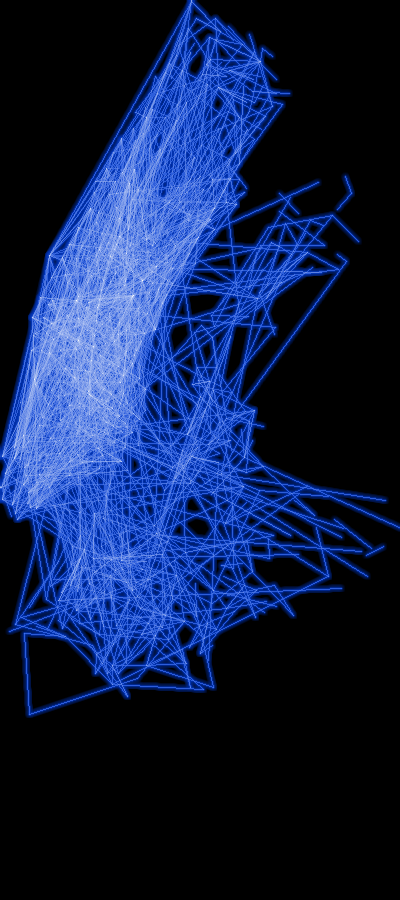

In [28]:
paths = mar20_df[mar20_df.hour==8]
paths = paths.iloc[:3000,:]

# generate empty pixel array, choose your resolution
image_data = np.zeros((900,400))

# generate pixel coordinates of starting points and end points
xys = [row_to_pixel(row, image_data.shape) for i, row in paths.iterrows()]

# draw the lines
image_data = add_lines(image_data, xys, weights=None, width = 1)
Image.fromarray(to_image(image_data*10)[:,:,:3],mode="RGB")

In [32]:
# make a list of locations (latitude longitude) for each station id
locations = mar20_df.groupby("start station id").mean()
locations = locations.loc[:,["start station latitude", "start station longitude"]]

# group by each unique pair of (start-station, end-station) and count the number of trips
mar20_df["path_id"] = [(id1,id2) for id1,id2 in zip(mar20_df["start station id"], 
                                                     mar20_df["end station id"])]
paths = mar20_df[mar20_df["hour"]==8].groupby("path_id").count().iloc[:,[1]] 
paths.columns = ["trip count"]

# select only paths with more than X trips
paths = paths[paths["trip count"]>5]
paths["start station id"] = paths.index.map(lambda x:x[0])
paths["end station id"] = paths.index.map(lambda x:x[1])
paths = paths[paths["start station id"]!=paths["end station id"]]

# join latitude/longitude into new table
paths = paths.join(locations,on="start station id")
locations.columns = ["end station latitude","end station longitude"]
paths = paths.join(locations,on="end station id")
paths.index = range(len(paths))

paths.shape

(2491, 7)

In [33]:
def get_image_data(paths, min_count=0, max_count=None):
    # generate empty pixel array
    image_data = np.zeros((900*2,400*2))
    
    # generate pixel coordinates of starting points and end points
    if max_count is None:
        max_count = paths["trip count"].max()+1
    selector = (paths["trip count"]>= min_count) & (paths["trip count"]< max_count)
    xys = [row_to_pixel(row, image_data.shape) for i, row in paths[selector].iterrows()]

    # draw the lines
    image_data = add_lines(image_data, xys, weights=paths["trip count"], width = 1)
    return image_data

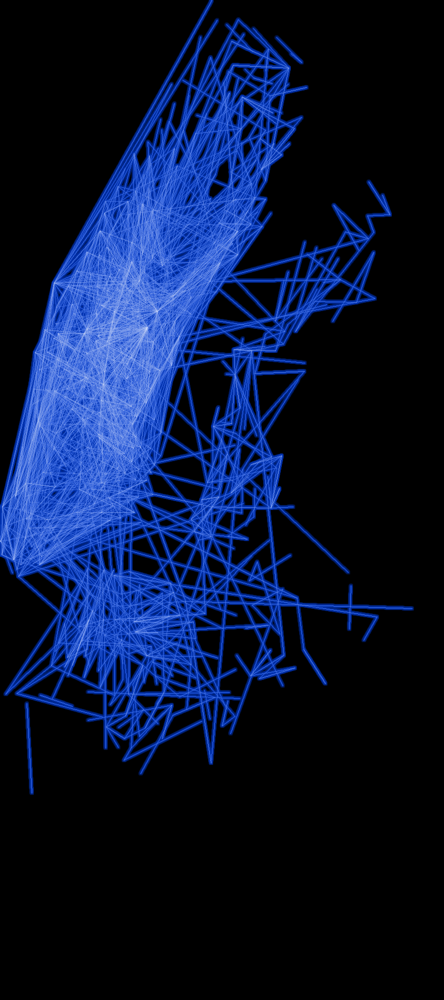

In [34]:
Image.fromarray(to_image(get_image_data(paths)*10)[:,:,:3],mode="RGB")

In [35]:
def add_alpha(image_data):
    """
    Uses the Value in HSV as an alpha channel. 
    This creates an image that blends nicely with a black background.
    """
    
    # get hsv image
    hsv = rgb_to_hsv(image_data[:,:,:3].astype(float)/255)
    
    # create new image and set alpha channel
    new_image_data = np.zeros(image_data.shape)
    new_image_data[:,:,3] = hsv[:,:,2]
    
    # set value of hsv image to either 0 or 1.
    hsv[:,:,2] = np.where(hsv[:,:,2]>0, 1, 0)
    
    # combine alpha and new rgb
    new_image_data[:,:,:3] = hsv_to_rgb(hsv)
    return new_image_data

In [37]:
folium_map = folium.Map(location=[40.738, -73.98],
                        zoom_start=12,
                        tiles="CartoDB dark_matter",
                        width='50%')

# create the overlay
map_overlay = add_alpha(to_image(image_data*10))

# compute extent of image in lat/lon
aspect_ratio = map_overlay.shape[1]/map_overlay.shape[0]
delta_lat = (max_lon-min_lon)/aspect_ratio*np.cos(min_lat/360*2*np.pi)

# add the image to the map
img = folium.raster_layers.ImageOverlay(map_overlay,
                           bounds = [(max_lat-delta_lat,min_lon),(max_lat,max_lon)],
                           opacity = 1,
                           name = "Paths")

img.add_to(folium_map)
folium.LayerControl().add_to(folium_map)

# show the map
folium_map

In [38]:
folium_map = folium.Map(location=[40.738, -73.98],
                        zoom_start=12,
                        tiles="CartoDB dark_matter",
                        width='50%')

thresholds = [5,15,25]

for i,t in enumerate(thresholds):
    upper = thresholds[i+1] if i<len(thresholds)-1 else None
    image_data = get_image_data(paths, t, upper)
    name = "{} < Num. Trips < {}".format(t,"max" if upper is None else upper)

    map_overlay = add_alpha(to_image(image_data*10))
    delta_lat = (max_lon-min_lon)/map_overlay.shape[1]*map_overlay.shape[0]*np.cos(min_lat/360*2*np.pi)
    img = folium.raster_layers.ImageOverlay(map_overlay,
                               bounds = [(max_lat-delta_lat,min_lon),(max_lat,max_lon)],
                               name = name)

    img.add_to(folium_map)

lc = folium.LayerControl().add_to(folium_map)

folium_map

In [39]:
mar20_df.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,...,birth year,gender,year,month,day,hour,minute,IsWeekday,TimeSlice,path_id
0,1589,2020-03-01 00:00:03.6400,2020-03-01 00:26:32.9860,224,Spruce St & Nassau St,40.711464,-74.005524,3574,Prospect Pl & Underhill Ave,40.676969,...,1980,1,2020,3,1,0,0,False,0,"(224, 3574)"
1,389,2020-03-01 00:00:16.7560,2020-03-01 00:06:46.0620,293,Lafayette St & E 8 St,40.730207,-73.991026,223,W 13 St & 7 Ave,40.737815,...,1991,2,2020,3,1,0,0,False,0,"(293, 223)"
2,614,2020-03-01 00:00:20.0580,2020-03-01 00:10:34.2200,379,W 31 St & 7 Ave,40.749156,-73.991600,515,W 43 St & 10 Ave,40.760094,...,1991,1,2020,3,1,0,0,False,0,"(379, 515)"
3,597,2020-03-01 00:00:24.3510,2020-03-01 00:10:22.3390,3739,Perry St & Greenwich Ave,40.735918,-74.000939,325,E 19 St & 3 Ave,40.736245,...,1989,1,2020,3,1,0,0,False,0,"(3739, 325)"
4,1920,2020-03-01 00:00:26.1120,2020-03-01 00:32:26.2680,236,St Marks Pl & 2 Ave,40.728419,-73.987140,3124,46 Ave & 5 St,40.747310,...,1993,1,2020,3,1,0,0,False,0,"(236, 3124)"


## Graph Theory - NetworkX

In [40]:
import networkx as nx

In [41]:
network_df = mar20_df[['start station id','start station name','end station id','end station name','path_id']]

In [42]:
nw_df_grouped = network_df.groupby(['path_id']).first()

In [48]:
nw_count = list(network_df.groupby(['path_id']).count()['start station id'])

In [49]:
nw_df_grouped['weight'] = nw_count
nw_df_grouped.head()

,start station id,start station name,end station id,end station name,weight
path_id,,,,,
"(72, 72)",72,W 52 St & 11 Ave,72,W 52 St & 11 Ave,114
"(72, 79)",72,W 52 St & 11 Ave,79,Franklin St & W Broadway,6
"(72, 116)",72,W 52 St & 11 Ave,116,W 17 St & 8 Ave,6
"(72, 127)",72,W 52 St & 11 Ave,127,Barrow St & Hudson St,25
"(72, 128)",72,W 52 St & 11 Ave,128,MacDougal St & Prince St,7


In [54]:
G = nx.Graph()
for row in nw_df_grouped.index:
    source = nw_df_grouped['start station name'][row]
    target = nw_df_grouped['end station name'][row]
    weight = nw_df_grouped['weight'][row]
    if source!=target:
        G.add_edge(source,target, weight=weight)

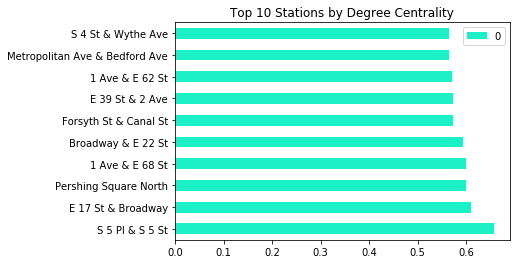

In [55]:
pd.DataFrame.from_dict(nx.degree_centrality(G), orient='index').sort_values(
    by=0, ascending=False).head(10).plot(kind='barh', color="#1cf0c7")
plt.title('Top 10 Stations by Degree Centrality');

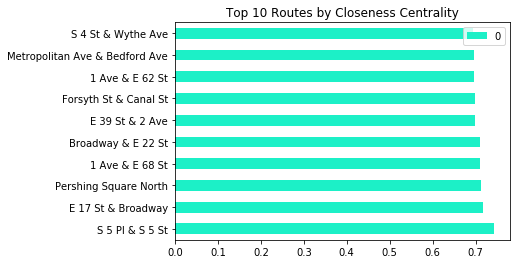

In [56]:
pd.DataFrame.from_dict(nx.closeness_centrality(G), orient='index').sort_values(
    by=0, ascending=False).head(10).plot(kind='barh', color="#1cf0c7")
plt.title('Top 10 Routes by Closeness Centrality');

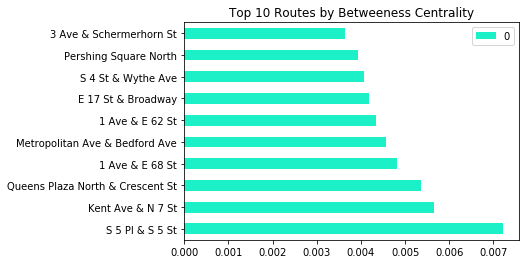

In [57]:
pd.DataFrame.from_dict(nx.betweenness_centrality(G), orient='index').sort_values(
    by=0, ascending=False).head(10).plot(kind='barh', color="#1cf0c7")
plt.title('Top 10 Routes by Betweeness Centrality');

In [58]:
degrees = nx.degree_centrality(G)
closeness = nx.closeness_centrality(G)
betweeness = nx.betweenness_centrality(G)
eigs = nx.eigenvector_centrality(G)
centrality = pd.DataFrame([degrees, closeness, betweeness, eigs]).transpose()
centrality.columns = ["degrees", "closeness", "betweeness", "eigs"]
centrality = centrality.sort_values(by='eigs', ascending=False)
centrality.head()

,degrees,closeness,betweeness,eigs
E 17 St & Broadway,0.609810,0.718175,0.004174,0.062461
Pershing Square North,0.599777,0.712470,0.003935,0.061676
Broadway & E 22 St,0.593088,0.709652,0.003481,0.061413
Broadway & W 25 St,0.556299,0.691063,0.002699,0.059578
1 Ave & E 68 St,0.598662,0.711340,0.004823,0.058913


In [59]:
centrality['bridge_proxy'] = centrality.betweeness / centrality.degrees
centrality = centrality.sort_values(by='bridge_proxy', ascending=False)
centrality.head(10)

,degrees,closeness,betweeness,eigs,bridge_proxy
Lexington Ave & E 120 St,0.161650,0.529204,0.002294,0.014614,0.014194
Adam Clayton Powell Blvd & W 118 St,0.195095,0.540361,0.002340,0.018539,0.011995
S 5 Pl & S 5 St,0.656633,0.742550,0.007218,0.057818,0.010992
Queens Plaza North & Crescent St,0.516165,0.670905,0.005360,0.046286,0.010384
Kent Ave & N 7 St,0.557414,0.691063,0.005649,0.045337,0.010134
3 Ave & Schermerhorn St,0.394649,0.621191,0.003631,0.033832,0.009200
12 Ave & W 125 St,0.309922,0.589744,0.002709,0.033580,0.008741
Metropolitan Ave & Bedford Ave,0.565217,0.695349,0.004571,0.046764,0.008086
1 Ave & E 68 St,0.598662,0.711340,0.004823,0.058913,0.008057
Greenpoint Ave & Manhattan Ave,0.379041,0.613963,0.002961,0.026819,0.007813


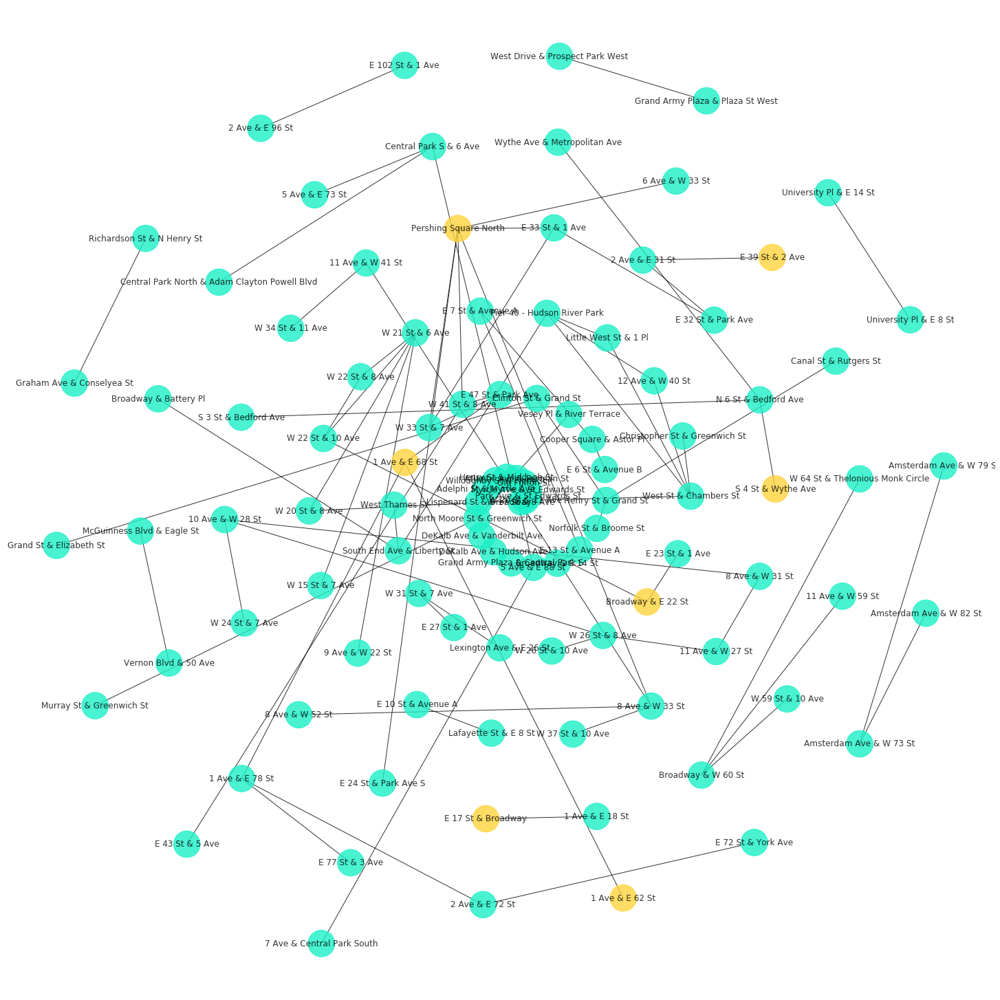

In [77]:
threshold = 120
colors = []
G = nx.Graph()
for row in nw_df_grouped.index:
    source = nw_df_grouped['start station name'][row]
    target = nw_df_grouped['end station name'][row]
    weight = nw_df_grouped['weight'][row]
    if weight >= threshold:
        if source!=target:
            G.add_edge(source,target, weight=weight)
edge_labels = labels = nx.get_edge_attributes(G,'weight')
for node in G.nodes:
    if node in centrality.sort_values(by='degrees', ascending=False).index[:10]:
        colors.append("#ffd43d")
    else:
        colors.append("#1cf0c7")
plt.figure(figsize=(20,20))
nx.draw(G, with_labels=True, pos=nx.spiral_layout(G),
        edge_labels=edge_labels, alpha=.8, node_color=colors, node_size=1500);
# nx.draw_networkx_edge_labels(G,pos=nx.spring_layout(G, random_state=10),edge_labels=labels);

In [79]:
kc_clusters = list(nx.algorithms.community.k_clique_communities(G, k=2))

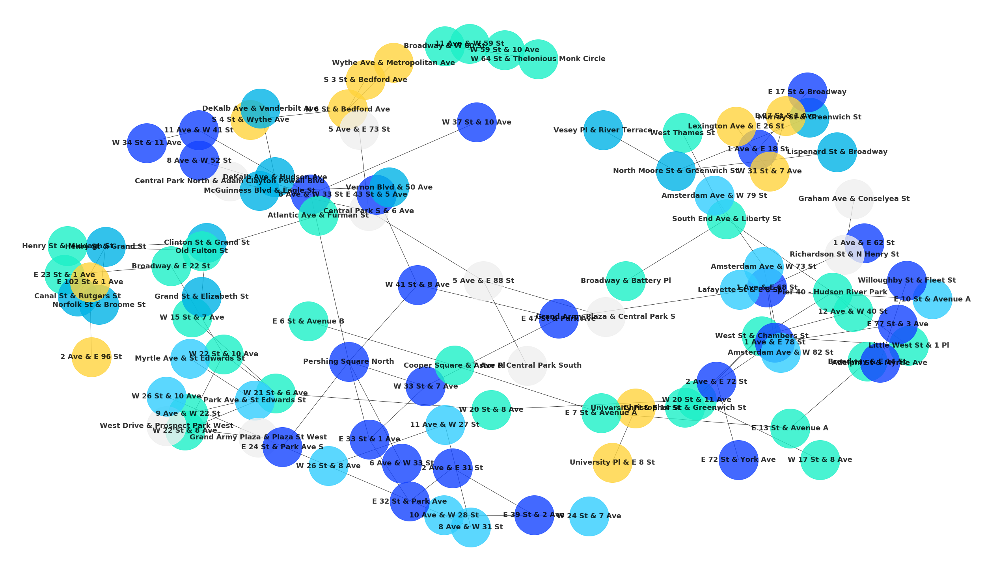

In [81]:
colors = [("teal","#1cf0c7"),
         ("workzone_yellow","#ffd43d"),
         ("light-blue","#00b3e6"),
         ("medium-blue","#32cefe"),
         ("gray","#efefef"),
         ("dark-blue", "#1443ff")]
color_dict = dict(colors)

fig = plt.figure(figsize=(35,20))
for n, ci in enumerate(kc_clusters):
    ci = G.subgraph(ci)
    nx.draw(ci, pos=nx.spring_layout(G, k=2, seed=10), with_labels=True, node_color=colors[n%len(colors)][1],
            alpha=.8, node_size=10000, font_weight="bold", font_size=18)